In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [2]:
import panel as pn

In [3]:
df = pd.read_csv('Medicare_GV_by_National_State_County_2022.csv', low_memory=False)
df

,YEAR,BENE_GEO_LVL,BENE_GEO_DESC,BENE_GEO_CD,BENE_AGE_LVL,BENES_TOTAL_CNT,BENES_WTH_PTAPTB_CNT,BENES_FFS_CNT,BENES_MA_CNT,MA_PRTCPTN_RATE,...,PQI11_BCTRL_PNA_AGE_LT_65,PQI11_BCTRL_PNA_AGE_65_74,PQI11_BCTRL_PNA_AGE_GE_75,PQI12_UTI_AGE_LT_65,PQI12_UTI_AGE_65_74,PQI12_UTI_AGE_GE_75,PQI15_ASTHMA_AGE_LT_40,PQI16_LWRXTRMTY_AMPUTN_AGE_LT_65,PQI16_LWRXTRMTY_AMPUTN_AGE_65_74,PQI16_LWRXTRMTY_AMPUTN_AGE_GE_75
0,2014,National,National,NaN,All,56767775,49302821,33462969,15839852,0.3213,...,686,499,1373,361,269,1120,286,147,50,47
1,2014,National,National,NaN,<65,9286837,7824336,5867170,1957166,0.2501,...,686,NaN,NaN,361,NaN,NaN,286,147,NaN,NaN
2,2014,National,National,NaN,>=65,47480938,41478485,27595799,13882686,0.3347,...,NaN,499,1373,NaN,269,1120,NaN,NaN,50,47
3,2014,State,AK,2.0,All,84573,71860,71383,477,0.0066,...,622,366,1271,181,152,703,*,130,*,72
4,2014,State,AK,2.0,<65,13294,11641,11578,63,0.0054,...,622,NaN,NaN,181,NaN,NaN,*,130,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30268,2022,County,WY-Washakie,56043.0,All,2150,1895,1716,179,0.0945,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
30269,2022,County,WY-Weston,56045.0,All,1877,1705,1522,183,0.1073,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
30270,2022,State,ZZ,NaN,All,*,*,*,*,*,...,*,*,*,*,*,*,*,*,*,*
30271,2022,State,ZZ,NaN,<65,*,*,*,*,*,...,*,NaN,NaN,*,NaN,NaN,*,*,NaN,NaN


In [4]:
print(df.info())
print(df.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30273 entries, 0 to 30272
Columns: 247 entries, YEAR to PQI16_LWRXTRMTY_AMPUTN_AGE_GE_75
dtypes: float64(1), int64(1), object(245)
memory usage: 57.0+ MB
None
(30273, 247)


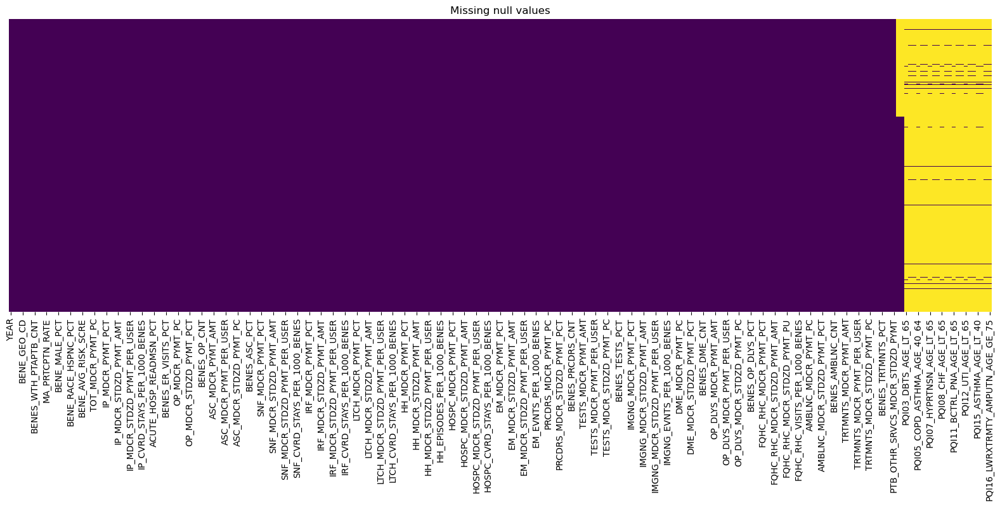

In [5]:
missing_percentage_pd = (
    df.isnull().mean() * 100  # Calculate percentage of missing values
).reset_index()

# Rename columns for clarity
missing_percentage_pd.columns = ["Column", "Missing_Percentage"]

# Save the missing percentage data to a CSV file
missing_percentage_pd.to_csv("missing_percentages_sdoh_county.csv", index=False)

# Create a binary matrix for missing values (0 = not missing, 1 = missing)
missing_matrix = df.isnull().astype(int)

# Plot the heatmap of missing values
plt.figure(figsize=(20, 6))
sns.heatmap(missing_matrix, yticklabels=False, cbar=False, cmap="viridis")
plt.title("Missing null values")
#plt.savefig("figures/missing_percentages_COUNTY.png", format="png", dpi=800)
plt.show()

/tmp/ipykernel_1106228/637636214.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


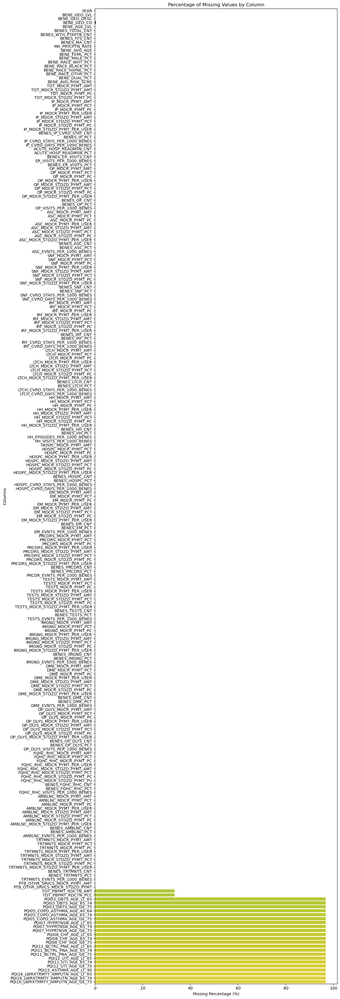

In [6]:
# Create a bar plot
plt.figure(figsize=(12, 35))
sns.barplot(
    data=missing_percentage_pd,
    y="Column",
    x="Missing_Percentage",
    palette="viridis"
)

# Add labels and title
plt.xlabel("Missing Percentage (%)")
plt.ylabel("Columns")
plt.title("Percentage of Missing Values by Column")
plt.tight_layout()

# Save the plot
#plt.savefig("figures/missing_percentage_barplot.png", format="png", dpi=800)
plt.show()

In [7]:
filtered_missing = missing_percentage_pd[missing_percentage_pd["Missing_Percentage"] > 20]

# Sort the filtered data for better visualization
filtered_missing = filtered_missing.sort_values(
    by="Missing_Percentage", ascending=False
)
print(f"Columns with more than 20% missing data:\n{filtered_missing}")

Columns with more than 20% missing data:
                               Column  Missing_Percentage
226              PQI03_DBTS_AGE_65_74            96.67030
225              PQI03_DBTS_AGE_LT_65            96.67030
228       PQI05_COPD_ASTHMA_AGE_40_64            96.67030
227              PQI03_DBTS_AGE_GE_75            96.67030
229       PQI05_COPD_ASTHMA_AGE_65_74            96.67030
230       PQI05_COPD_ASTHMA_AGE_GE_75            96.67030
232          PQI07_HYPRTNSN_AGE_65_74            96.67030
231          PQI07_HYPRTNSN_AGE_LT_65            96.67030
239         PQI11_BCTRL_PNA_AGE_GE_75            96.67030
240               PQI12_UTI_AGE_LT_65            96.67030
233          PQI07_HYPRTNSN_AGE_GE_75            96.67030
234               PQI08_CHF_AGE_LT_65            96.67030
235               PQI08_CHF_AGE_65_74            96.67030
236               PQI08_CHF_AGE_GE_75            96.67030
237         PQI11_BCTRL_PNA_AGE_LT_65            96.67030
238         PQI11_BCTRL_PNA_AGE

In [8]:
df

,YEAR,BENE_GEO_LVL,BENE_GEO_DESC,BENE_GEO_CD,BENE_AGE_LVL,BENES_TOTAL_CNT,BENES_WTH_PTAPTB_CNT,BENES_FFS_CNT,BENES_MA_CNT,MA_PRTCPTN_RATE,...,PQI11_BCTRL_PNA_AGE_LT_65,PQI11_BCTRL_PNA_AGE_65_74,PQI11_BCTRL_PNA_AGE_GE_75,PQI12_UTI_AGE_LT_65,PQI12_UTI_AGE_65_74,PQI12_UTI_AGE_GE_75,PQI15_ASTHMA_AGE_LT_40,PQI16_LWRXTRMTY_AMPUTN_AGE_LT_65,PQI16_LWRXTRMTY_AMPUTN_AGE_65_74,PQI16_LWRXTRMTY_AMPUTN_AGE_GE_75
0,2014,National,National,NaN,All,56767775,49302821,33462969,15839852,0.3213,...,686,499,1373,361,269,1120,286,147,50,47
1,2014,National,National,NaN,<65,9286837,7824336,5867170,1957166,0.2501,...,686,NaN,NaN,361,NaN,NaN,286,147,NaN,NaN
2,2014,National,National,NaN,>=65,47480938,41478485,27595799,13882686,0.3347,...,NaN,499,1373,NaN,269,1120,NaN,NaN,50,47
3,2014,State,AK,2.0,All,84573,71860,71383,477,0.0066,...,622,366,1271,181,152,703,*,130,*,72
4,2014,State,AK,2.0,<65,13294,11641,11578,63,0.0054,...,622,NaN,NaN,181,NaN,NaN,*,130,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30268,2022,County,WY-Washakie,56043.0,All,2150,1895,1716,179,0.0945,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
30269,2022,County,WY-Weston,56045.0,All,1877,1705,1522,183,0.1073,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
30270,2022,State,ZZ,NaN,All,*,*,*,*,*,...,*,*,*,*,*,*,*,*,*,*
30271,2022,State,ZZ,NaN,<65,*,*,*,*,*,...,*,NaN,NaN,*,NaN,NaN,*,*,NaN,NaN


In [9]:
national_df = df[df['BENE_GEO_LVL'] == 'National']
national_df = national_df.drop(['BENE_GEO_LVL', 'BENE_GEO_DESC', 'BENE_GEO_CD'], axis=1).fillna(0)
state_df = df[df['BENE_GEO_LVL'] == 'State']
state_df = state_df.drop('BENE_GEO_LVL', axis=1).fillna(0)
county_df = df[df['BENE_GEO_LVL'] == 'County']
county_df = county_df.drop('BENE_GEO_LVL', axis=1).fillna(0)

/tmp/ipykernel_1106228/1464645001.py:6: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  county_df = county_df.drop('BENE_GEO_LVL', axis=1).fillna(0)


In [10]:
national_df

,YEAR,BENE_AGE_LVL,BENES_TOTAL_CNT,BENES_WTH_PTAPTB_CNT,BENES_FFS_CNT,BENES_MA_CNT,MA_PRTCPTN_RATE,BENE_AVG_AGE,BENE_FEML_PCT,BENE_MALE_PCT,...,PQI11_BCTRL_PNA_AGE_LT_65,PQI11_BCTRL_PNA_AGE_65_74,PQI11_BCTRL_PNA_AGE_GE_75,PQI12_UTI_AGE_LT_65,PQI12_UTI_AGE_65_74,PQI12_UTI_AGE_GE_75,PQI15_ASTHMA_AGE_LT_40,PQI16_LWRXTRMTY_AMPUTN_AGE_LT_65,PQI16_LWRXTRMTY_AMPUTN_AGE_65_74,PQI16_LWRXTRMTY_AMPUTN_AGE_GE_75
0,2014,All,56767775,49302821,33462969,15839852,0.3213,71,0.5505,0.4495,...,686,499,1373,361,269,1120,286,147,50,47
1,2014,<65,9286837,7824336,5867170,1957166,0.2501,51,0.4769,0.5231,...,686,0,0,361,0,0,286,147,0,0
2,2014,>=65,47480938,41478485,27595799,13882686,0.3347,76,0.5661,0.4339,...,0,499,1373,0,269,1120,0,0,50,47
3363,2015,All,58294174,50775877,33551396,17224481,0.3392,71,0.5494,0.4506,...,626,471,1365,332,256,1082,233,155,51,48
3364,2015,<65,9328029,7879122,5725437,2153685,0.2733,51,0.4783,0.5217,...,626,0,0,332,0,0,233,155,0,0
3365,2015,>=65,48966145,42896755,27825959,15070796,0.3513,76,0.564,0.436,...,0,471,1365,0,256,1082,0,0,51,48
6727,2016,All,59748950,52166410,33981630,18184780,0.3486,71,0.5488,0.4512,...,575,407,1160,320,244,1040,186,190,58,52
6728,2016,<65,9264528,7883813,5598935,2284878,0.2898,51,0.4793,0.5207,...,575,0,0,320,0,0,186,190,0,0
6729,2016,>=65,50484422,44282597,28382695,15899902,0.3591,75,0.5626,0.4374,...,0,407,1160,0,244,1040,0,0,58,52
10090,2017,All,61183227,53301510,33725800,19575710,0.3673,72,0.5477,0.4523,...,407,286,909,306,236,997,169,219,66,57


In [11]:
exclude_column = 'BENE_AGE_LVL'

for col in national_df.columns:
    if col != exclude_column:
        national_df[col] = pd.to_numeric(national_df[col], errors='coerce')

In [12]:
national_df = national_df.join(pd.get_dummies(national_df['BENE_AGE_LVL'], dtype=int))
national_df = national_df.drop(columns=['BENE_AGE_LVL'])
national_df.to_csv('national_MGV.csv', index=False)

In [13]:
state_df = state_df.replace('*', 11)
state_df.to_csv('all_states_MGV.csv', index=False)
state_df

,YEAR,BENE_GEO_DESC,BENE_GEO_CD,BENE_AGE_LVL,BENES_TOTAL_CNT,BENES_WTH_PTAPTB_CNT,BENES_FFS_CNT,BENES_MA_CNT,MA_PRTCPTN_RATE,BENE_AVG_AGE,...,PQI11_BCTRL_PNA_AGE_LT_65,PQI11_BCTRL_PNA_AGE_65_74,PQI11_BCTRL_PNA_AGE_GE_75,PQI12_UTI_AGE_LT_65,PQI12_UTI_AGE_65_74,PQI12_UTI_AGE_GE_75,PQI15_ASTHMA_AGE_LT_40,PQI16_LWRXTRMTY_AMPUTN_AGE_LT_65,PQI16_LWRXTRMTY_AMPUTN_AGE_65_74,PQI16_LWRXTRMTY_AMPUTN_AGE_GE_75
3,2014,AK,2.0,All,84573,71860,71383,477,0.0066,70,...,622,366,1271,181,152,703,11,130,11,72
4,2014,AK,2.0,<65,13294,11641,11578,63,0.0054,51,...,622,0,0,181,0,0,11,130,0,0
5,2014,AK,2.0,>=65,71279,60219,59805,414,0.0069,74,...,0,366,1271,0,152,703,0,0,11,72
36,2014,AL,1.0,All,994352,898687,674129,224558,0.2499,70,...,768,706,1597,365,342,1238,293,158,68,71
37,2014,AL,1.0,<65,238551,210248,151187,59061,0.2809,51,...,768,0,0,365,0,0,293,158,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30244,2022,WY,56.0,<65,12789,10992,10027,965,0.0878,52,...,618,0,0,229,0,0,0,219,0,0
30245,2022,WY,56.0,>=65,113740,102267,93599,8668,0.0848,74,...,0,315,1012,0,161,602,0,0,37,28
30270,2022,ZZ,0.0,All,11,11,11,11,11,11,...,11,11,11,11,11,11,11,11,11,11
30271,2022,ZZ,0.0,<65,11,11,11,11,11,11,...,11,0,0,11,0,0,11,11,0,0


In [14]:
filtered_df = state_df[state_df['BENE_GEO_DESC'] == 'TX']
filtered_df = filtered_df.drop(['BENE_GEO_DESC'], axis=1)
filtered_df

,YEAR,BENE_GEO_CD,BENE_AGE_LVL,BENES_TOTAL_CNT,BENES_WTH_PTAPTB_CNT,BENES_FFS_CNT,BENES_MA_CNT,MA_PRTCPTN_RATE,BENE_AVG_AGE,BENE_FEML_PCT,...,PQI11_BCTRL_PNA_AGE_LT_65,PQI11_BCTRL_PNA_AGE_65_74,PQI11_BCTRL_PNA_AGE_GE_75,PQI12_UTI_AGE_LT_65,PQI12_UTI_AGE_65_74,PQI12_UTI_AGE_GE_75,PQI15_ASTHMA_AGE_LT_40,PQI16_LWRXTRMTY_AMPUTN_AGE_LT_65,PQI16_LWRXTRMTY_AMPUTN_AGE_65_74,PQI16_LWRXTRMTY_AMPUTN_AGE_GE_75
2699,2014,48.0,All,3703369,3240783,2235761,1005022,0.3101,71,0.5485,...,677,540,1510,465,335,1352,227,239,69,65
2700,2014,48.0,<65,602452,511178,366451,144727,0.2831,51,0.4773,...,677,0,0,465,0,0,227,239,0,0
2701,2014,48.0,>=65,3100917,2729605,1869310,860295,0.3152,75,0.5625,...,0,540,1510,0,335,1352,0,0,69,65
6063,2015,48.0,All,3829645,3298699,2190152,1108547,0.3361,71,0.5463,...,681,506,1497,412,314,1286,186,264,67,61
6064,2015,48.0,<65,606476,498882,340325,158557,0.3178,51,0.4754,...,681,0,0,412,0,0,186,264,0,0
6065,2015,48.0,>=65,3223169,2799817,1849827,949990,0.3393,75,0.5593,...,0,506,1497,0,314,1286,0,0,67,61
9426,2016,48.0,All,3950816,3452456,2222439,1230017,0.3563,72,0.5463,...,579,410,1217,408,304,1274,151,332,81,68
9427,2016,48.0,<65,603849,509178,331622,177556,0.3487,51,0.4773,...,579,0,0,408,0,0,151,332,0,0
9428,2016,48.0,>=65,3346967,2943278,1890817,1052461,0.3576,75,0.5585,...,0,410,1217,0,304,1274,0,0,81,68
12789,2017,48.0,All,4076427,3545023,2205833,1339190,0.3778,72,0.5451,...,413,302,978,407,298,1236,97,358,89,71


In [15]:
filtered_df = filtered_df.join(pd.get_dummies(filtered_df['BENE_AGE_LVL'], dtype=int))
filtered_df = filtered_df.drop(columns=['BENE_AGE_LVL'])

In [16]:
filtered_df

,YEAR,BENE_GEO_CD,BENES_TOTAL_CNT,BENES_WTH_PTAPTB_CNT,BENES_FFS_CNT,BENES_MA_CNT,MA_PRTCPTN_RATE,BENE_AVG_AGE,BENE_FEML_PCT,BENE_MALE_PCT,...,PQI12_UTI_AGE_LT_65,PQI12_UTI_AGE_65_74,PQI12_UTI_AGE_GE_75,PQI15_ASTHMA_AGE_LT_40,PQI16_LWRXTRMTY_AMPUTN_AGE_LT_65,PQI16_LWRXTRMTY_AMPUTN_AGE_65_74,PQI16_LWRXTRMTY_AMPUTN_AGE_GE_75,<65,>=65,All
2699,2014,48.0,3703369,3240783,2235761,1005022,0.3101,71,0.5485,0.4515,...,465,335,1352,227,239,69,65,0,0,1
2700,2014,48.0,602452,511178,366451,144727,0.2831,51,0.4773,0.5227,...,465,0,0,227,239,0,0,1,0,0
2701,2014,48.0,3100917,2729605,1869310,860295,0.3152,75,0.5625,0.4375,...,0,335,1352,0,0,69,65,0,1,0
6063,2015,48.0,3829645,3298699,2190152,1108547,0.3361,71,0.5463,0.4537,...,412,314,1286,186,264,67,61,0,0,1
6064,2015,48.0,606476,498882,340325,158557,0.3178,51,0.4754,0.5246,...,412,0,0,186,264,0,0,1,0,0
6065,2015,48.0,3223169,2799817,1849827,949990,0.3393,75,0.5593,0.4407,...,0,314,1286,0,0,67,61,0,1,0
9426,2016,48.0,3950816,3452456,2222439,1230017,0.3563,72,0.5463,0.4537,...,408,304,1274,151,332,81,68,0,0,1
9427,2016,48.0,603849,509178,331622,177556,0.3487,51,0.4773,0.5227,...,408,0,0,151,332,0,0,1,0,0
9428,2016,48.0,3346967,2943278,1890817,1052461,0.3576,75,0.5585,0.4415,...,0,304,1274,0,0,81,68,0,1,0
12789,2017,48.0,4076427,3545023,2205833,1339190,0.3778,72,0.5451,0.4549,...,407,298,1236,97,358,89,71,0,0,1


In [17]:
for col in filtered_df.columns:
    filtered_df[col] = pd.to_numeric(filtered_df[col], errors='coerce')

In [18]:
filtered_df

,YEAR,BENE_GEO_CD,BENES_TOTAL_CNT,BENES_WTH_PTAPTB_CNT,BENES_FFS_CNT,BENES_MA_CNT,MA_PRTCPTN_RATE,BENE_AVG_AGE,BENE_FEML_PCT,BENE_MALE_PCT,...,PQI12_UTI_AGE_LT_65,PQI12_UTI_AGE_65_74,PQI12_UTI_AGE_GE_75,PQI15_ASTHMA_AGE_LT_40,PQI16_LWRXTRMTY_AMPUTN_AGE_LT_65,PQI16_LWRXTRMTY_AMPUTN_AGE_65_74,PQI16_LWRXTRMTY_AMPUTN_AGE_GE_75,<65,>=65,All
2699,2014,48.0,3703369,3240783,2235761,1005022,0.3101,71,0.5485,0.4515,...,465,335,1352,227,239,69,65,0,0,1
2700,2014,48.0,602452,511178,366451,144727,0.2831,51,0.4773,0.5227,...,465,0,0,227,239,0,0,1,0,0
2701,2014,48.0,3100917,2729605,1869310,860295,0.3152,75,0.5625,0.4375,...,0,335,1352,0,0,69,65,0,1,0
6063,2015,48.0,3829645,3298699,2190152,1108547,0.3361,71,0.5463,0.4537,...,412,314,1286,186,264,67,61,0,0,1
6064,2015,48.0,606476,498882,340325,158557,0.3178,51,0.4754,0.5246,...,412,0,0,186,264,0,0,1,0,0
6065,2015,48.0,3223169,2799817,1849827,949990,0.3393,75,0.5593,0.4407,...,0,314,1286,0,0,67,61,0,1,0
9426,2016,48.0,3950816,3452456,2222439,1230017,0.3563,72,0.5463,0.4537,...,408,304,1274,151,332,81,68,0,0,1
9427,2016,48.0,603849,509178,331622,177556,0.3487,51,0.4773,0.5227,...,408,0,0,151,332,0,0,1,0,0
9428,2016,48.0,3346967,2943278,1890817,1052461,0.3576,75,0.5585,0.4415,...,0,304,1274,0,0,81,68,0,1,0
12789,2017,48.0,4076427,3545023,2205833,1339190,0.3778,72,0.5451,0.4549,...,407,298,1236,97,358,89,71,0,0,1


In [19]:
filtered_df.to_csv('TEXAS_states_MGV.csv', index=False)

In [20]:
county_df

,YEAR,BENE_GEO_DESC,BENE_GEO_CD,BENE_AGE_LVL,BENES_TOTAL_CNT,BENES_WTH_PTAPTB_CNT,BENES_FFS_CNT,BENES_MA_CNT,MA_PRTCPTN_RATE,BENE_AVG_AGE,...,PQI11_BCTRL_PNA_AGE_LT_65,PQI11_BCTRL_PNA_AGE_65_74,PQI11_BCTRL_PNA_AGE_GE_75,PQI12_UTI_AGE_LT_65,PQI12_UTI_AGE_65_74,PQI12_UTI_AGE_GE_75,PQI15_ASTHMA_AGE_LT_40,PQI16_LWRXTRMTY_AMPUTN_AGE_LT_65,PQI16_LWRXTRMTY_AMPUTN_AGE_65_74,PQI16_LWRXTRMTY_AMPUTN_AGE_GE_75
6,2014,AK-Aleutians East,2013.0,All,168,*,117,*,*,71,...,0,0,0,0,0,0,0,0,0,0
7,2014,AK-Aleutians West,2016.0,All,231,136,136,0,0,69,...,0,0,0,0,0,0,0,0,0,0
8,2014,AK-Anchorage,2020.0,All,33247,27755,27578,177,0.0064,70,...,0,0,0,0,0,0,0,0,0,0
9,2014,AK-Bethel,2050.0,All,1311,*,1059,*,*,71,...,0,0,0,0,0,0,0,0,0,0
10,2014,AK-Bristol Bay,2060.0,All,122,104,104,0,0,72,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30265,2022,WY-Teton,56039.0,All,4213,3785,3490,295,0.0779,73,...,0,0,0,0,0,0,0,0,0,0
30266,2022,WY-UNKNOWN,56000.0,All,*,*,*,*,*,*,...,0,0,0,0,0,0,0,0,0,0
30267,2022,WY-Uinta,56041.0,All,4223,3715,2943,772,0.2078,71,...,0,0,0,0,0,0,0,0,0,0
30268,2022,WY-Washakie,56043.0,All,2150,1895,1716,179,0.0945,74,...,0,0,0,0,0,0,0,0,0,0


In [21]:
county_df = county_df.replace('*', 11)
county_df

,YEAR,BENE_GEO_DESC,BENE_GEO_CD,BENE_AGE_LVL,BENES_TOTAL_CNT,BENES_WTH_PTAPTB_CNT,BENES_FFS_CNT,BENES_MA_CNT,MA_PRTCPTN_RATE,BENE_AVG_AGE,...,PQI11_BCTRL_PNA_AGE_LT_65,PQI11_BCTRL_PNA_AGE_65_74,PQI11_BCTRL_PNA_AGE_GE_75,PQI12_UTI_AGE_LT_65,PQI12_UTI_AGE_65_74,PQI12_UTI_AGE_GE_75,PQI15_ASTHMA_AGE_LT_40,PQI16_LWRXTRMTY_AMPUTN_AGE_LT_65,PQI16_LWRXTRMTY_AMPUTN_AGE_65_74,PQI16_LWRXTRMTY_AMPUTN_AGE_GE_75
6,2014,AK-Aleutians East,2013.0,All,168,11,117,11,11,71,...,0,0,0,0,0,0,0,0,0,0
7,2014,AK-Aleutians West,2016.0,All,231,136,136,0,0,69,...,0,0,0,0,0,0,0,0,0,0
8,2014,AK-Anchorage,2020.0,All,33247,27755,27578,177,0.0064,70,...,0,0,0,0,0,0,0,0,0,0
9,2014,AK-Bethel,2050.0,All,1311,11,1059,11,11,71,...,0,0,0,0,0,0,0,0,0,0
10,2014,AK-Bristol Bay,2060.0,All,122,104,104,0,0,72,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30265,2022,WY-Teton,56039.0,All,4213,3785,3490,295,0.0779,73,...,0,0,0,0,0,0,0,0,0,0
30266,2022,WY-UNKNOWN,56000.0,All,11,11,11,11,11,11,...,0,0,0,0,0,0,0,0,0,0
30267,2022,WY-Uinta,56041.0,All,4223,3715,2943,772,0.2078,71,...,0,0,0,0,0,0,0,0,0,0
30268,2022,WY-Washakie,56043.0,All,2150,1895,1716,179,0.0945,74,...,0,0,0,0,0,0,0,0,0,0


In [22]:
county_df[['STATE', 'COUNTY']] = county_df['BENE_GEO_DESC'].str.split('-', expand=True, n=1)
county_df = county_df.drop('BENE_GEO_DESC', axis=1)
county_df

/tmp/ipykernel_1106228/1248837956.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df[['STATE', 'COUNTY']] = county_df['BENE_GEO_DESC'].str.split('-', expand=True, n=1)
/tmp/ipykernel_1106228/1248837956.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df[['STATE', 'COUNTY']] = county_df['BENE_GEO_DESC'].str.split('-', expand=True, n=1)


,YEAR,BENE_GEO_CD,BENE_AGE_LVL,BENES_TOTAL_CNT,BENES_WTH_PTAPTB_CNT,BENES_FFS_CNT,BENES_MA_CNT,MA_PRTCPTN_RATE,BENE_AVG_AGE,BENE_FEML_PCT,...,PQI11_BCTRL_PNA_AGE_GE_75,PQI12_UTI_AGE_LT_65,PQI12_UTI_AGE_65_74,PQI12_UTI_AGE_GE_75,PQI15_ASTHMA_AGE_LT_40,PQI16_LWRXTRMTY_AMPUTN_AGE_LT_65,PQI16_LWRXTRMTY_AMPUTN_AGE_65_74,PQI16_LWRXTRMTY_AMPUTN_AGE_GE_75,STATE,COUNTY
6,2014,2013.0,All,168,11,117,11,11,71,0.4359,...,0,0,0,0,0,0,0,0,AK,Aleutians East
7,2014,2016.0,All,231,136,136,0,0,69,0.4779,...,0,0,0,0,0,0,0,0,AK,Aleutians West
8,2014,2020.0,All,33247,27755,27578,177,0.0064,70,0.5261,...,0,0,0,0,0,0,0,0,AK,Anchorage
9,2014,2050.0,All,1311,11,1059,11,11,71,0.4958,...,0,0,0,0,0,0,0,0,AK,Bethel
10,2014,2060.0,All,122,104,104,0,0,72,0.4231,...,0,0,0,0,0,0,0,0,AK,Bristol Bay
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30265,2022,56039.0,All,4213,3785,3490,295,0.0779,73,0.5029,...,0,0,0,0,0,0,0,0,WY,Teton
30266,2022,56000.0,All,11,11,11,11,11,11,11,...,0,0,0,0,0,0,0,0,WY,UNKNOWN
30267,2022,56041.0,All,4223,3715,2943,772,0.2078,71,0.4992,...,0,0,0,0,0,0,0,0,WY,Uinta
30268,2022,56043.0,All,2150,1895,1716,179,0.0945,74,0.5175,...,0,0,0,0,0,0,0,0,WY,Washakie


In [23]:
county_df.to_csv('all_counties_MGV.csv', index=False)

In [24]:
filtered_df = county_df[county_df['STATE'] == 'TX']
filtered_df = filtered_df.drop(['STATE','BENE_AGE_LVL' ], axis=1)

In [25]:
filtered_df.shape

(2295, 245)

In [26]:
last_column = filtered_df.columns[-1]  # Get the last column name
filtered_df = filtered_df[[last_column] + [col for col in filtered_df.columns[:-1]]] 

In [27]:
filtered_df.to_csv('TEXAS_counties_MGV.csv', index=False)

In [28]:
filtered_df.columns.tolist()

['COUNTY',
 'YEAR',
 'BENE_GEO_CD',
 'BENES_TOTAL_CNT',
 'BENES_WTH_PTAPTB_CNT',
 'BENES_FFS_CNT',
 'BENES_MA_CNT',
 'MA_PRTCPTN_RATE',
 'BENE_AVG_AGE',
 'BENE_FEML_PCT',
 'BENE_MALE_PCT',
 'BENE_RACE_WHT_PCT',
 'BENE_RACE_BLACK_PCT',
 'BENE_RACE_HSPNC_PCT',
 'BENE_RACE_OTHR_PCT',
 'BENE_DUAL_PCT',
 'BENE_AVG_RISK_SCRE',
 'TOT_MDCR_PYMT_AMT',
 'TOT_MDCR_STDZD_PYMT_AMT',
 'TOT_MDCR_PYMT_PC',
 'TOT_MDCR_STDZD_PYMT_PC',
 'IP_MDCR_PYMT_AMT',
 'IP_MDCR_PYMT_PCT',
 'IP_MDCR_PYMT_PC',
 'IP_MDCR_PYMT_PER_USER',
 'IP_MDCR_STDZD_PYMT_AMT',
 'IP_MDCR_STDZD_PYMT_PCT',
 'IP_MDCR_STDZD_PYMT_PC',
 'IP_MDCR_STDZD_PYMT_PER_USER',
 'BENES_IP_CVRD_STAY_CNT',
 'BENES_IP_PCT',
 'IP_CVRD_STAYS_PER_1000_BENES',
 'IP_CVRD_DAYS_PER_1000_BENES',
 'ACUTE_HOSP_READMSN_CNT',
 'ACUTE_HOSP_READMSN_PCT',
 'BENES_ER_VISITS_CNT',
 'ER_VISITS_PER_1000_BENES',
 'BENES_ER_VISITS_PCT',
 'OP_MDCR_PYMT_AMT',
 'OP_MDCR_PYMT_PCT',
 'OP_MDCR_PYMT_PC',
 'OP_MDCR_PYMT_PER_USER',
 'OP_MDCR_STDZD_PYMT_AMT',
 'OP_MDCR_STDZD_PYMT_PCT

In [29]:
labels = pd.read_csv('2020_Census_ua_st_list_all_TEXAS.csv').drop(['STATE', 'PART', 'Unnamed: 0', 'UACE', 'STATEFP'], axis=1)
labels

,NAME,POP,HOUSING,AREALAND,AREALANDSQMI,AREAWATER,AREAWATERSQMI,POPDEN
0,Abilene,"118,138","50,514","160,509,868",61.97,"1,015,710",0.39,"1,906.28"
1,Alice,"19,413","7,966","25,980,592",10.03,0,0.00,"1,935.27"
2,Alpine,"6,283","3,292","11,103,460",4.29,688,0.00,"1,465.57"
3,Alvarado,"5,034","1,869","7,883,213",3.04,"39,327",0.02,"1,653.89"
4,Amarillo,"205,860","87,615","217,541,054",83.99,"1,780,045",0.69,"2,450.92"
...,...,...,...,...,...,...,...,...
190,Wharton,"8,526","3,907","12,064,164",4.66,"7,360",0.00,"1,830.40"
191,Whitehouse,"9,139","3,272","13,499,092",5.21,"151,177",0.06,"1,753.44"
192,Wichita Falls,"97,039","42,923","131,530,216",50.78,0,0.00,"1,910.81"
193,Yoakum,"5,598","2,473","8,161,955",3.15,0,0.00,"1,776.38"


In [30]:
urban_counties = labels['NAME'].unique().tolist()

In [31]:
filtered_df['Urban'] = np.where(filtered_df['COUNTY'].isin(urban_counties), 1, 0)
filtered_df

/tmp/ipykernel_1106228/831736970.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  filtered_df['Urban'] = np.where(filtered_df['COUNTY'].isin(urban_counties), 1, 0)


,COUNTY,YEAR,BENE_GEO_CD,BENES_TOTAL_CNT,BENES_WTH_PTAPTB_CNT,BENES_FFS_CNT,BENES_MA_CNT,MA_PRTCPTN_RATE,BENE_AVG_AGE,BENE_FEML_PCT,...,PQI11_BCTRL_PNA_AGE_65_74,PQI11_BCTRL_PNA_AGE_GE_75,PQI12_UTI_AGE_LT_65,PQI12_UTI_AGE_65_74,PQI12_UTI_AGE_GE_75,PQI15_ASTHMA_AGE_LT_40,PQI16_LWRXTRMTY_AMPUTN_AGE_LT_65,PQI16_LWRXTRMTY_AMPUTN_AGE_65_74,PQI16_LWRXTRMTY_AMPUTN_AGE_GE_75,Urban
2702,Anderson,2014,48001.0,9942,9069,6905,2164,0.2386,71,0.5513,...,0,0,0,0,0,0,0,0,0,0
2703,Andrews,2014,48003.0,2096,1893,1558,335,0.177,72,0.5552,...,0,0,0,0,0,0,0,0,0,1
2704,Angelina,2014,48005.0,16708,15345,11495,3850,0.2509,70,0.5428,...,0,0,0,0,0,0,0,0,0,0
2705,Aransas,2014,48007.0,7249,6653,4235,2418,0.3634,72,0.5164,...,0,0,0,0,0,0,0,0,0,0
2706,Archer,2014,48009.0,1813,1696,1481,215,0.1268,72,0.5381,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29862,Wood,2022,48499.0,16074,14656,8049,6607,0.4508,74,0.5283,...,0,0,0,0,0,0,0,0,0,0
29863,Yoakum,2022,48501.0,1327,1165,731,434,0.3725,73,0.5144,...,0,0,0,0,0,0,0,0,0,1
29864,Young,2022,48503.0,4672,4215,3151,1064,0.2524,73,0.5363,...,0,0,0,0,0,0,0,0,0,0
29865,Zapata,2022,48505.0,2136,1821,811,1010,0.5546,72,0.5327,...,0,0,0,0,0,0,0,0,0,0


In [32]:
filtered_df.to_csv('MGV_Labeled.csv', index= False)

In [33]:
excluded_column = 'COUNTY'

# Convert all columns except 'excluded_column' to numeric
filtered_df = filtered_df.apply(
    lambda x: pd.to_numeric(x, errors='coerce') if x.name != excluded_column else x
)

In [34]:
topics ={
'BENE': ['BENE_GEO_CD', 'BENE_AVG_AGE', 'BENE_FEML_PCT', 'BENE_MALE_PCT', 'BENE_RACE_WHT_PCT', 'BENE_RACE_BLACK_PCT', 'BENE_RACE_HSPNC_PCT', 'BENE_RACE_OTHR_PCT', 'BENE_DUAL_PCT', 'BENE_AVG_RISK_SCRE'],
'BENES': ['BENES_TOTAL_CNT', 'BENES_WTH_PTAPTB_CNT', 'BENES_FFS_CNT', 'BENES_MA_CNT', 'BENES_IP_CVRD_STAY_CNT', 'BENES_IP_PCT', 'BENES_ER_VISITS_CNT', 'BENES_ER_VISITS_PCT', 'BENES_OP_CNT', 'BENES_OP_PCT', 'BENES_ASC_CNT', 'BENES_ASC_PCT', 'BENES_SNF_CNT', 'BENES_SNF_PCT', 'BENES_IRF_CNT', 'BENES_IRF_PCT', 'BENES_LTCH_CNT', 'BENES_LTCH_PCT', 'BENES_HH_CNT', 'BENES_HH_PCT', 'BENES_HOSPC_CNT', 'BENES_HOSPC_PCT', 'BENES_EM_CNT', 'BENES_EM_PCT', 'BENES_PRCDRS_CNT', 'BENES_PRCDRS_PCT', 'BENES_TESTS_CNT', 'BENES_TESTS_PCT', 'BENES_IMGNG_CNT', 'BENES_IMGNG_PCT', 'BENES_DME_CNT', 'BENES_DME_PCT', 'BENES_OP_DLYS_CNT', 'BENES_OP_DLYS_PCT', 'BENES_FQHC_RHC_CNT', 'BENES_FQHC_RHC_PCT', 'BENES_AMBLNC_CNT', 'BENES_AMBLNC_PCT', 'BENES_TRTMNTS_CNT', 'BENES_TRTMNTS_PCT'],
'MA': ['MA_PRTCPTN_RATE'],
'TOT': ['TOT_MDCR_PYMT_AMT', 'TOT_MDCR_STDZD_PYMT_AMT', 'TOT_MDCR_PYMT_PC', 'TOT_MDCR_STDZD_PYMT_PC', 'TOT_PBPMT_RDCTN_AMT', 'TOT_PBPMT_RDCTN_PCC'],
'IP': ['IP_MDCR_PYMT_AMT', 'IP_MDCR_PYMT_PCT', 'IP_MDCR_PYMT_PC', 'IP_MDCR_PYMT_PER_USER', 'IP_MDCR_STDZD_PYMT_AMT', 'IP_MDCR_STDZD_PYMT_PCT', 'IP_MDCR_STDZD_PYMT_PC', 'IP_MDCR_STDZD_PYMT_PER_USER', 'IP_CVRD_STAYS_PER_1000_BENES', 'IP_CVRD_DAYS_PER_1000_BENES'],
'ACUTE': ['ACUTE_HOSP_READMSN_CNT', 'ACUTE_HOSP_READMSN_PCT'],
'ER': ['ER_VISITS_PER_1000_BENES'],
'OP': ['OP_MDCR_PYMT_AMT', 'OP_MDCR_PYMT_PCT', 'OP_MDCR_PYMT_PC', 'OP_MDCR_PYMT_PER_USER', 'OP_MDCR_STDZD_PYMT_AMT', 'OP_MDCR_STDZD_PYMT_PCT', 'OP_MDCR_STDZD_PYMT_PC', 'OP_MDCR_STDZD_PYMT_PER_USER', 'OP_VISITS_PER_1000_BENES', 'OP_DLYS_MDCR_PYMT_AMT', 'OP_DLYS_MDCR_PYMT_PCT', 'OP_DLYS_MDCR_PYMT_PC', 'OP_DLYS_MDCR_PYMT_PER_USER', 'OP_DLYS_MDCR_STDZD_PYMT_AMT', 'OP_DLYS_MDCR_STDZD_PYMT_PCT', 'OP_DLYS_MDCR_STDZD_PYMT_PC', 'OP_DLYS_MDCR_STDZD_PYMT_PER_USER', 'OP_DLYS_VISITS_PER_1000_BENES'],
'ASC': ['ASC_MDCR_PYMT_AMT', 'ASC_MDCR_PYMT_PCT', 'ASC_MDCR_PYMT_PC', 'ASC_MDCR_PYMT_PER_USER', 'ASC_MDCR_STDZD_PYMT_AMT', 'ASC_MDCR_STDZD_PYMT_PCT', 'ASC_MDCR_STDZD_PYMT_PC', 'ASC_MDCR_STDZD_PYMT_PER_USER', 'ASC_EVNTS_PER_1000_BENES'],
'SNF': ['SNF_MDCR_PYMT_AMT', 'SNF_MDCR_PYMT_PCT', 'SNF_MDCR_PYMT_PC', 'SNF_MDCR_PYMT_PER_USER', 'SNF_MDCR_STDZD_PYMT_AMT', 'SNF_MDCR_STDZD_PYMT_PCT', 'SNF_MDCR_STDZD_PYMT_PC', 'SNF_MDCR_STDZD_PYMT_PER_USER', 'SNF_CVRD_STAYS_PER_1000_BENES', 'SNF_CVRD_DAYS_PER_1000_BENES'],
'IRF': ['IRF_MDCR_PYMT_AMT', 'IRF_MDCR_PYMT_PCT', 'IRF_MDCR_PYMT_PC', 'IRF_MDCR_PYMT_PER_USER', 'IRF_MDCR_STDZD_PYMT_AMT', 'IRF_MDCR_STDZD_PYMT_PCT', 'IRF_MDCR_STDZD_PYMT_PC', 'IRF_MDCR_STDZD_PYMT_PER_USER', 'IRF_CVRD_STAYS_PER_1000_BENES', 'IRF_CVRD_DAYS_PER_1000_BENES'],
'LTCH': ['LTCH_MDCR_PYMT_AMT', 'LTCH_MDCR_PYMT_PCT', 'LTCH_MDCR_PYMT_PC', 'LTCH_MDCR_PYMT_PER_USER', 'LTCH_MDCR_STDZD_PYMT_AMT', 'LTCH_MDCR_STDZD_PYMT_PCT', 'LTCH_MDCR_STDZD_PYMT_PC', 'LTCH_MDCR_STDZD_PYMT_PER_USER', 'LTCH_CVRD_STAYS_PER_1000_BENES', 'LTCH_CVRD_DAYS_PER_1000_BENES'],
'HH': ['HH_MDCR_PYMT_AMT', 'HH_MDCR_PYMT_PCT', 'HH_MDCR_PYMT_PC', 'HH_MDCR_PYMT_PER_USER', 'HH_MDCR_STDZD_PYMT_AMT', 'HH_MDCR_STDZD_PYMT_PCT', 'HH_MDCR_STDZD_PYMT_PC', 'HH_MDCR_STDZD_PYMT_PER_USER', 'HH_EPISODES_PER_1000_BENES', 'HH_VISITS_PER_1000_BENES'],
'HOSPC': ['HOSPC_MDCR_PYMT_AMT', 'HOSPC_MDCR_PYMT_PCT', 'HOSPC_MDCR_PYMT_PC', 'HOSPC_MDCR_PYMT_PER_USER', 'HOSPC_MDCR_STDZD_PYMT_AMT', 'HOSPC_MDCR_STDZD_PYMT_PCT', 'HOSPC_MDCR_STDZD_PYMT_PC', 'HOSPC_MDCR_STDZD_PYMT_PER_USER', 'HOSPC_CVRD_STAYS_PER_1000_BENES', 'HOSPC_CVRD_DAYS_PER_1000_BENES'],
'EM': ['EM_MDCR_PYMT_AMT', 'EM_MDCR_PYMT_PCT', 'EM_MDCR_PYMT_PC', 'EM_MDCR_PYMT_PER_USER', 'EM_MDCR_STDZD_PYMT_AMT', 'EM_MDCR_STDZD_PYMT_PCT', 'EM_MDCR_STDZD_PYMT_PC', 'EM_MDCR_STDZD_PYMT_PER_USER', 'EM_EVNTS_PER_1000_BENES'],
'PRCDRS': ['PRCDRS_MDCR_PYMT_AMT', 'PRCDRS_MDCR_PYMT_PCT', 'PRCDRS_MDCR_PYMT_PC', 'PRCDRS_MDCR_PYMT_PER_USER', 'PRCDRS_MDCR_STDZD_PYMT_AMT', 'PRCDRS_MDCR_STDZD_PYMT_PCT', 'PRCDRS_MDCR_STDZD_PYMT_PC', 'PRCDRS_MDCR_STDZD_PYMT_PER_USER'],
'PRCDR': ['PRCDR_EVNTS_PER_1000_BENES'],
'TESTS': ['TESTS_MDCR_PYMT_AMT', 'TESTS_MDCR_PYMT_PCT', 'TESTS_MDCR_PYMT_PC', 'TESTS_MDCR_PYMT_PER_USER', 'TESTS_MDCR_STDZD_PYMT_AMT', 'TESTS_MDCR_STDZD_PYMT_PCT', 'TESTS_MDCR_STDZD_PYMT_PC', 'TESTS_MDCR_STDZD_PYMT_PER_USER', 'TESTS_EVNTS_PER_1000_BENES'],
'IMGNG': ['IMGNG_MDCR_PYMT_AMT', 'IMGNG_MDCR_PYMT_PCT', 'IMGNG_MDCR_PYMT_PC', 'IMGNG_MDCR_PYMT_PER_USER', 'IMGNG_MDCR_STDZD_PYMT_AMT', 'IMGNG_MDCR_STDZD_PYMT_PCT', 'IMGNG_MDCR_STDZD_PYMT_PC', 'IMGNG_MDCR_STDZD_PYMT_PER_USER', 'IMGNG_EVNTS_PER_1000_BENES'],
'DME': ['DME_MDCR_PYMT_AMT', 'DME_MDCR_PYMT_PCT', 'DME_MDCR_PYMT_PC', 'DME_MDCR_PYMT_PER_USER', 'DME_MDCR_STDZD_PYMT_AMT', 'DME_MDCR_STDZD_PYMT_PCT', 'DME_MDCR_STDZD_PYMT_PC', 'DME_MDCR_STDZD_PYMT_PER_USER', 'DME_EVNTS_PER_1000_BENES'],
'FQHC': ['FQHC_RHC_MDCR_PYMT_AMT', 'FQHC_RHC_MDCR_PYMT_PCT', 'FQHC_RHC_MDCR_PYMT_PC', 'FQHC_RHC_MDCR_PYMT_PER_USER', 'FQHC_RHC_MDCR_STDZD_PYMT_AMT', 'FQHC_RHC_MDCR_STDZD_PYMT_PCT', 'FQHC_RHC_MDCR_STDZD_PYMT_PC', 'FQHC_RHC_MDCR_STDZD_PYMT_PU', 'FQHC_RHC_VISITS_PER_1000_BENES'],
'AMBLNC': ['AMBLNC_MDCR_PYMT_AMT', 'AMBLNC_MDCR_PYMT_PCT', 'AMBLNC_MDCR_PYMT_PC', 'AMBLNC_MDCR_PYMT_PER_USER', 'AMBLNC_MDCR_STDZD_PYMT_AMT', 'AMBLNC_MDCR_STDZD_PYMT_PCT', 'AMBLNC_MDCR_STDZD_PYMT_PC', 'AMBLNC_MDCR_STDZD_PYMT_PER_USER', 'AMBLNC_EVNTS_PER_1000_BENES'],
'TRTMNTS': ['TRTMNTS_MDCR_PYMT_AMT', 'TRTMNTS_MDCR_PYMT_PCT', 'TRTMNTS_MDCR_PYMT_PC', 'TRTMNTS_MDCR_PYMT_PER_USER', 'TRTMNTS_MDCR_STDZD_PYMT_AMT', 'TRTMNTS_MDCR_STDZD_PYMT_PCT', 'TRTMNTS_MDCR_STDZD_PYMT_PC', 'TRTMNTS_MDCR_STDZD_PYMT_PER_USER', 'TRTMNTS_EVNTS_PER_1000_BENES'],
'PTB': ['PTB_OTHR_SRVCS_MDCR_PYMT_AMT', 'PTB_OTHR_SRVCS_MDCR_STDZD_PYMT'],
'PQI03': ['PQI03_DBTS_AGE_LT_65', 'PQI03_DBTS_AGE_65_74', 'PQI03_DBTS_AGE_GE_75'],
'PQI05': ['PQI05_COPD_ASTHMA_AGE_40_64', 'PQI05_COPD_ASTHMA_AGE_65_74', 'PQI05_COPD_ASTHMA_AGE_GE_75'],
'PQI07': ['PQI07_HYPRTNSN_AGE_LT_65', 'PQI07_HYPRTNSN_AGE_65_74', 'PQI07_HYPRTNSN_AGE_GE_75'],
'PQI08': ['PQI08_CHF_AGE_LT_65', 'PQI08_CHF_AGE_65_74', 'PQI08_CHF_AGE_GE_75'],
'PQI11': ['PQI11_BCTRL_PNA_AGE_LT_65', 'PQI11_BCTRL_PNA_AGE_65_74', 'PQI11_BCTRL_PNA_AGE_GE_75'],
'PQI12': ['PQI12_UTI_AGE_LT_65', 'PQI12_UTI_AGE_65_74', 'PQI12_UTI_AGE_GE_75'],
'PQI15': ['PQI15_ASTHMA_AGE_LT_40'],
'PQI16': ['PQI16_LWRXTRMTY_AMPUTN_AGE_LT_65', 'PQI16_LWRXTRMTY_AMPUTN_AGE_65_74', 'PQI16_LWRXTRMTY_AMPUTN_AGE_GE_75'] }

In [35]:
def plot_topic_distributions(df, topics):
    for topic, columns in topics.items():
        # Create a subplot for each topic
        plt.figure(figsize=(10, len(columns)*4))
        
        for i, column in enumerate(columns, 1):
            plt.subplot(len(columns), 1, i)
            sns.histplot(df[column], kde=True, bins=20)
            plt.title(f'{topic} - {column}', fontsize=14)
            plt.xlabel(column)
            plt.ylabel('Frequency')
        
        plt.tight_layout()
        plt.show()

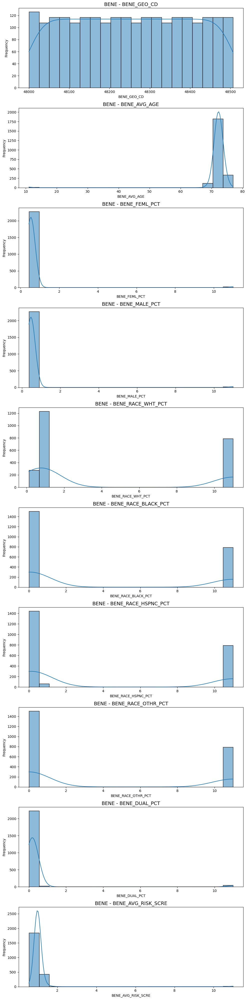

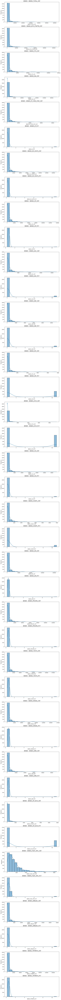

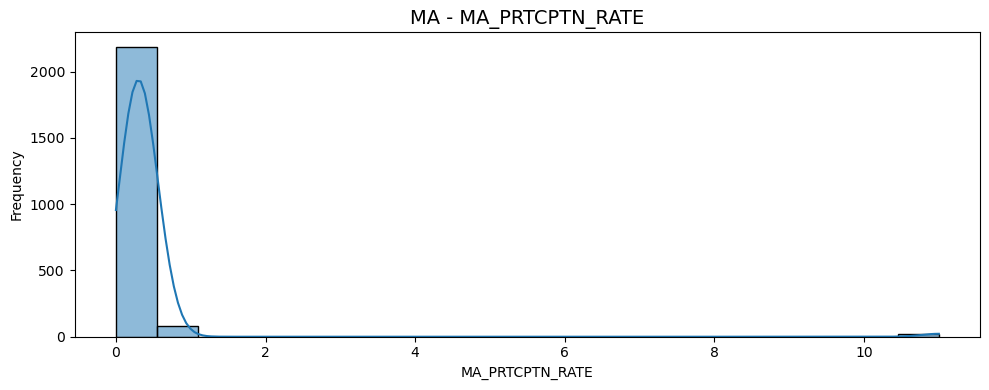

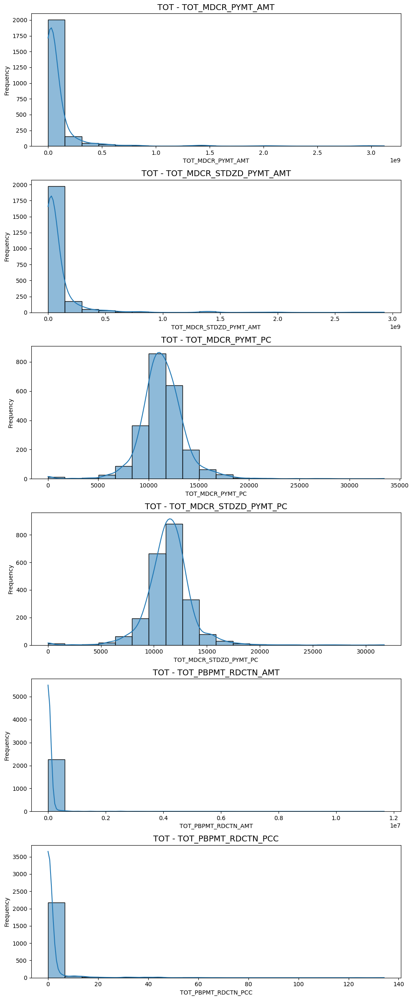

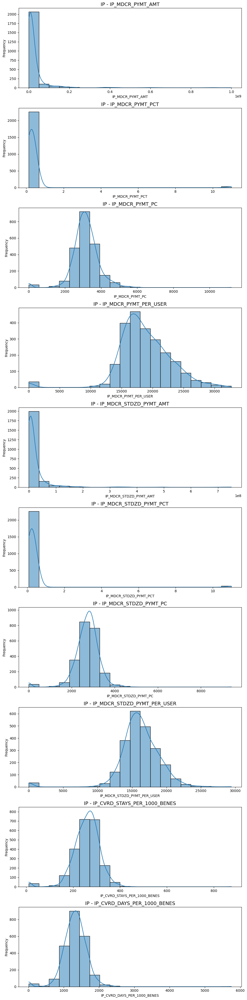

...

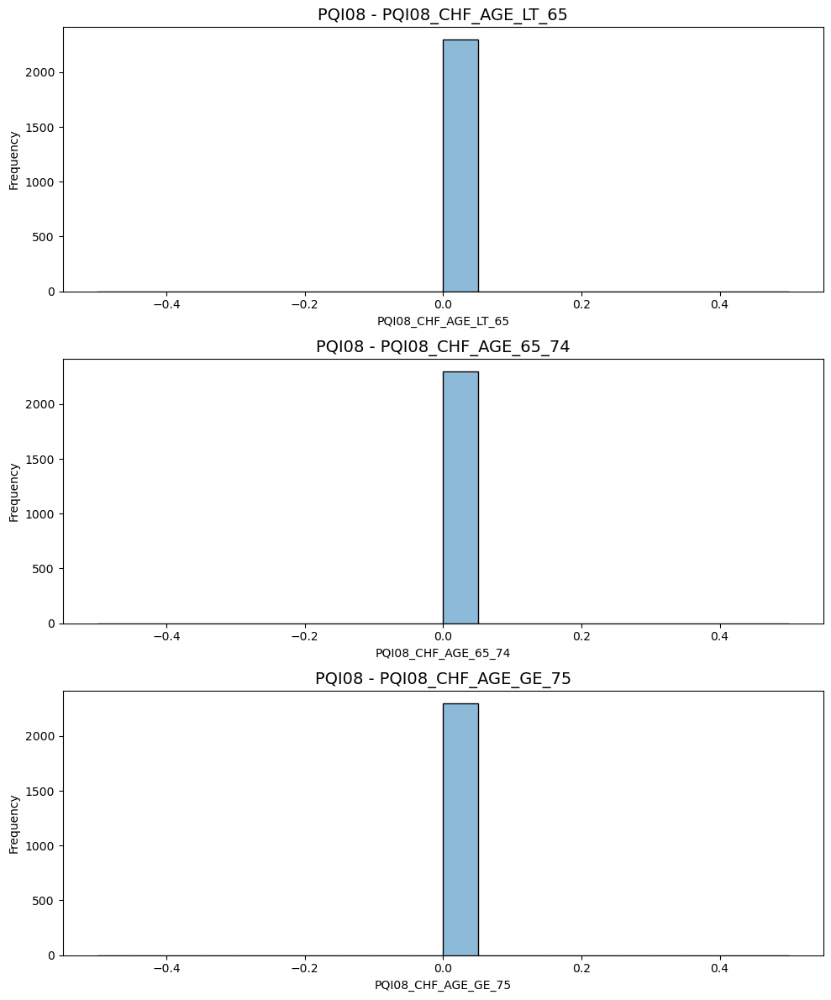

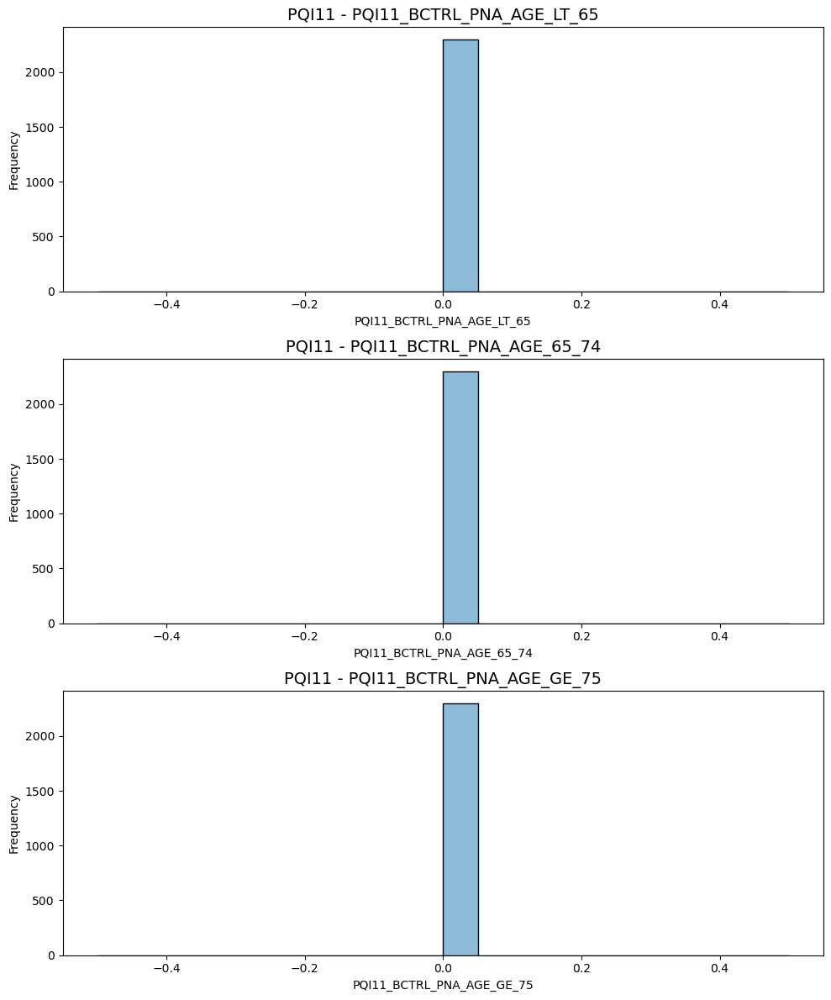

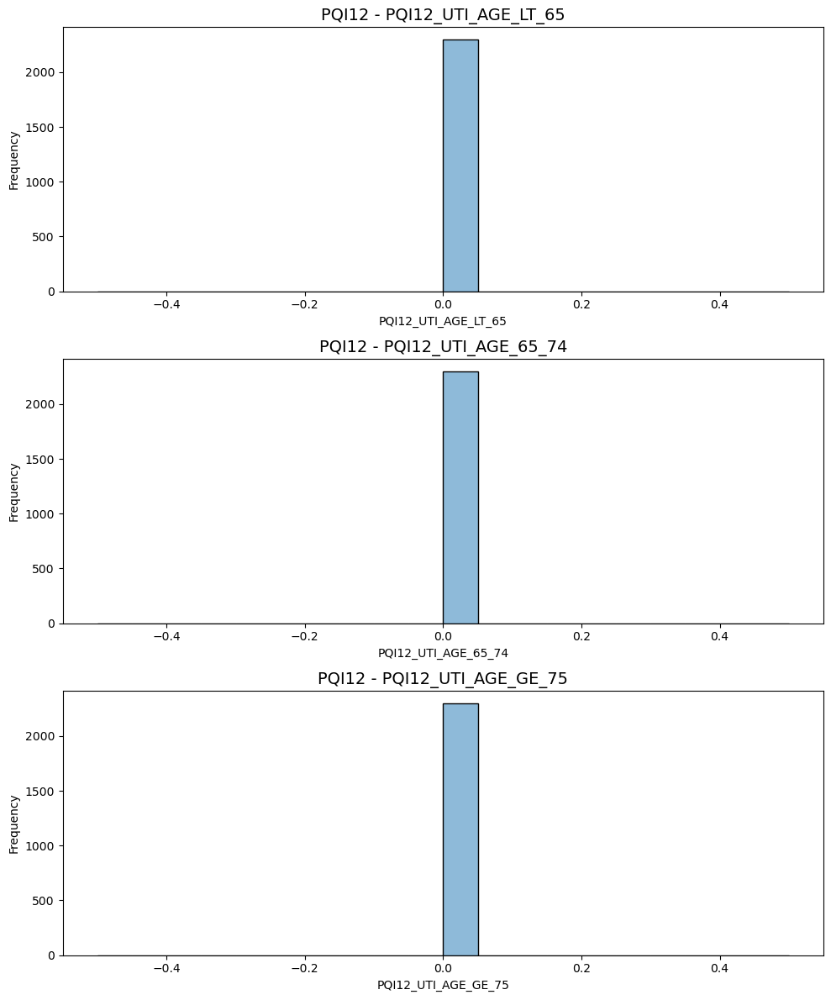

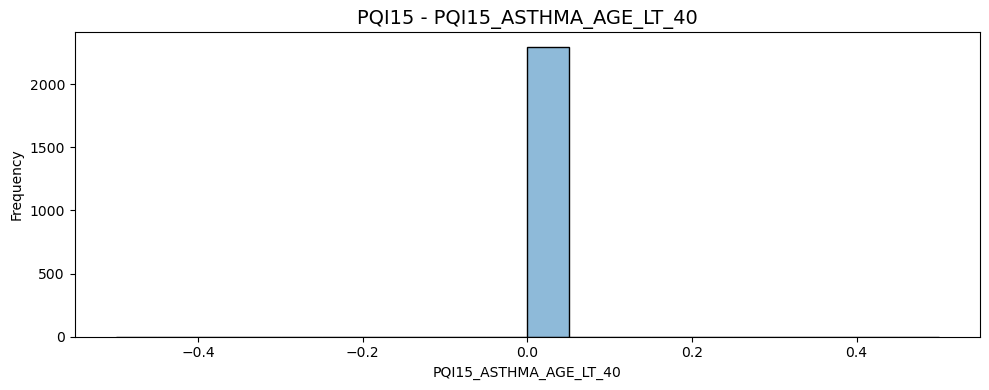

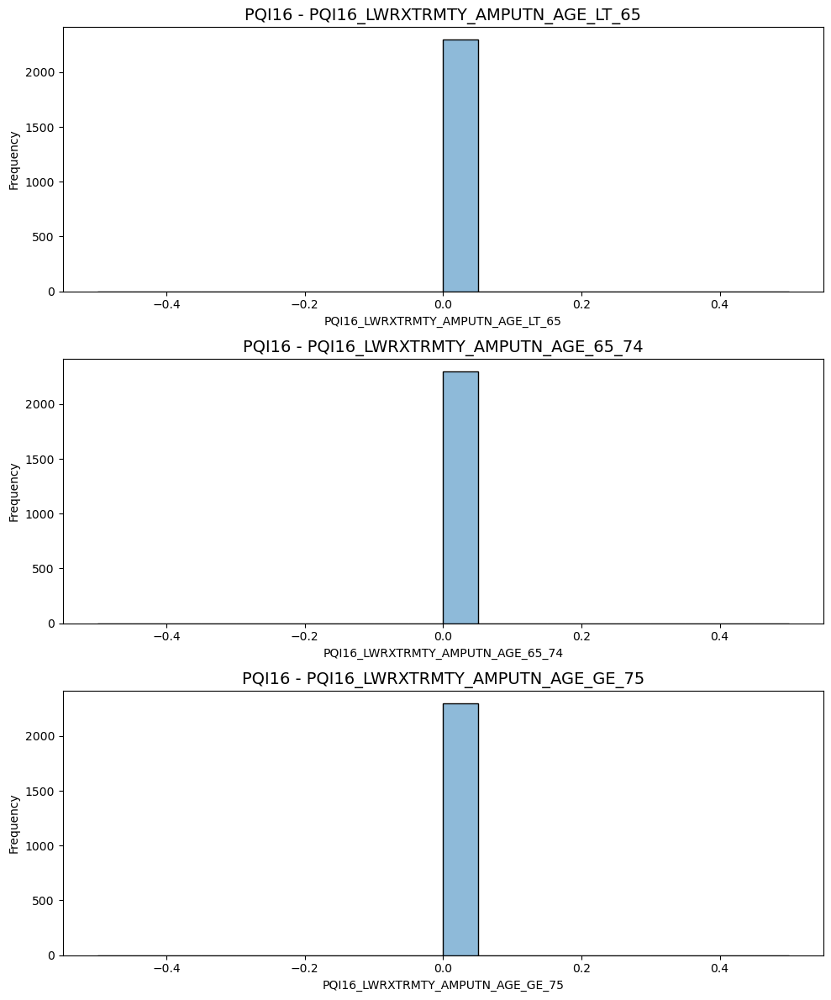

In [36]:
plot_topic_distributions(filtered_df, topics)

    BENE: Focus on demographic and risk information.
    BENES: Look at counts and percentages of services or conditions.
    IP/ER/OP: Examine payment amounts, percentages, and service utilization rates.
    MA/TOT: Understand overall costs and participation rates.
    
    For each topic:
        Compute aggregated statistics (e.g., min, max, mean, median).
        Visualize trends across categories.
        Identify potential anomalies.

'BENE': Describes the beneficiary demographics, including geographic code, average age, gender, racial distribution, dual eligibility (Medicare and Medicaid), and risk score.

'BENES': Information about the total number of beneficiaries and various service utilization counts (e.g., hospital stays, ER visits, outpatient procedures).

'MA': Medicare Advantage program participation rate.

'TOT': Total Medicare payments and standardized payment amounts.

'IP': Inpatient Medicare payments and related statistics.

'ACUTE': Acute hospital readmissions statistics.

'ER': Emergency room visits per 1,000 beneficiaries.

'OP': Outpatient Medicare payments and related statistics.

'ASC': Ambulatory Surgery Center (ASC) Medicare payments and related statistics.

'SNF': Skilled Nursing Facility (SNF) Medicare payments and related statistics.

'IRF': Inpatient Rehabilitation Facility (IRF) Medicare payments and related statistics.

'LTCH': Long-Term Care Hospital (LTCH) Medicare payments and related statistics.

'HH': Home Health (HH) Medicare payments and visits per 1,000 beneficiaries.

'HOSPC': Hospice Medicare payments and related statistics.

'EM': Emergency Medical (EM) services Medicare payments and event counts.

'PRCDRS': Medical procedure-related Medicare payments.

'PRCDR': Procedure events per 1,000 beneficiaries.

'TESTS': Medicare payments for medical tests and related statistics.

'IMGNG': Medicare payments for imaging services.

'DME': Durable Medical Equipment (DME) Medicare payments and related statistics.

'FQHC': Federally Qualified Health Center (FQHC) Medicare payments and visits.

'AMBLNC': Ambulance service Medicare payments and event counts.

'TRTMNTS': Treatment-related Medicare payments and events.

'PTB': Other services Medicare payments and standardized payment amounts.

'PQI': Preventable Quality Indicator (PQI) statistics by age group for specific conditions.

In [56]:
filtered_df

,COUNTY,YEAR,BENE_GEO_CD,BENES_TOTAL_CNT,BENES_WTH_PTAPTB_CNT,BENES_FFS_CNT,BENES_MA_CNT,MA_PRTCPTN_RATE,BENE_AVG_AGE,BENE_FEML_PCT,...,PQI11_BCTRL_PNA_AGE_65_74,PQI11_BCTRL_PNA_AGE_GE_75,PQI12_UTI_AGE_LT_65,PQI12_UTI_AGE_65_74,PQI12_UTI_AGE_GE_75,PQI15_ASTHMA_AGE_LT_40,PQI16_LWRXTRMTY_AMPUTN_AGE_LT_65,PQI16_LWRXTRMTY_AMPUTN_AGE_65_74,PQI16_LWRXTRMTY_AMPUTN_AGE_GE_75,Urban
2702,Anderson,2014,48001.0,9942,9069,6905,2164,0.2386,71,0.5513,...,0,0,0,0,0,0,0,0,0,0
2703,Andrews,2014,48003.0,2096,1893,1558,335,0.1770,72,0.5552,...,0,0,0,0,0,0,0,0,0,1
2704,Angelina,2014,48005.0,16708,15345,11495,3850,0.2509,70,0.5428,...,0,0,0,0,0,0,0,0,0,0
2705,Aransas,2014,48007.0,7249,6653,4235,2418,0.3634,72,0.5164,...,0,0,0,0,0,0,0,0,0,0
2706,Archer,2014,48009.0,1813,1696,1481,215,0.1268,72,0.5381,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29862,Wood,2022,48499.0,16074,14656,8049,6607,0.4508,74,0.5283,...,0,0,0,0,0,0,0,0,0,0
29863,Yoakum,2022,48501.0,1327,1165,731,434,0.3725,73,0.5144,...,0,0,0,0,0,0,0,0,0,1
29864,Young,2022,48503.0,4672,4215,3151,1064,0.2524,73,0.5363,...,0,0,0,0,0,0,0,0,0,0
29865,Zapata,2022,48505.0,2136,1821,811,1010,0.5546,72,0.5327,...,0,0,0,0,0,0,0,0,0,0


In [60]:
pivot_df = filtered_df.pivot_table(index=['COUNTY', 'YEAR'], aggfunc='mean').reset_index()
pivot_df

,COUNTY,YEAR,ACUTE_HOSP_READMSN_CNT,ACUTE_HOSP_READMSN_PCT,AMBLNC_EVNTS_PER_1000_BENES,AMBLNC_MDCR_PYMT_AMT,AMBLNC_MDCR_PYMT_PC,AMBLNC_MDCR_PYMT_PCT,AMBLNC_MDCR_PYMT_PER_USER,AMBLNC_MDCR_STDZD_PYMT_AMT,...,TRTMNTS_EVNTS_PER_1000_BENES,TRTMNTS_MDCR_PYMT_AMT,TRTMNTS_MDCR_PYMT_PC,TRTMNTS_MDCR_PYMT_PCT,TRTMNTS_MDCR_PYMT_PER_USER,TRTMNTS_MDCR_STDZD_PYMT_AMT,TRTMNTS_MDCR_STDZD_PYMT_PC,TRTMNTS_MDCR_STDZD_PYMT_PCT,TRTMNTS_MDCR_STDZD_PYMT_PER_USER,Urban
0,Anderson,2014,362.0,0.1861,373.3526,1454985.86,210.71,0.0197,1292.17,1548288.19,...,2692.9761,3774955.98,546.70,0.0510,945.87,3785852.95,548.28,0.0487,948.60,0.0
1,Anderson,2015,304.0,0.1607,406.3050,1479103.61,216.88,0.0193,1283.94,1538561.88,...,2717.7419,4060922.88,595.44,0.0530,1059.74,4134936.79,606.30,0.0507,1079.05,0.0
2,Anderson,2016,319.0,0.1755,390.9532,1510236.74,221.80,0.0211,1340.05,1430199.47,...,2492.7302,3533859.97,519.00,0.0495,948.69,3621804.99,531.91,0.0473,972.30,0.0
3,Anderson,2017,305.0,0.1712,486.2973,1688406.09,251.48,0.0234,1434.50,1594112.91,...,2347.3339,3377941.65,503.12,0.0468,938.32,3439989.44,512.36,0.0447,955.55,0.0
4,Anderson,2018,286.0,0.1783,457.4452,1417482.83,217.37,0.0201,1359.04,1344948.86,...,2385.6770,4309346.40,660.84,0.0610,1241.89,4371446.89,670.36,0.0584,1259.78,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2290,Zavala,2018,71.0,0.2391,650.7491,543477.00,508.87,0.0430,2638.24,369504.98,...,2209.7378,469967.56,440.04,0.0372,1037.46,480087.71,449.52,0.0374,1059.80,0.0
2291,Zavala,2019,63.0,0.2218,1550.1618,739743.51,798.00,0.0599,3832.87,519637.03,...,2360.3020,434990.26,469.25,0.0352,1141.71,442858.56,477.73,0.0367,1162.36,0.0
2292,Zavala,2020,47.0,0.1983,1846.3329,706850.01,822.88,0.0642,4258.13,527673.32,...,2307.3341,662558.26,771.31,0.0601,1830.27,657455.10,765.37,0.0619,1816.17,0.0
2293,Zavala,2021,33.0,0.1953,1709.5047,607374.79,813.09,0.0653,4745.12,459078.43,...,2299.8661,320984.34,429.70,0.0345,879.41,318222.02,426.00,0.0355,871.84,0.0


In [61]:
pivot_df.to_csv('Texas_MGV_Labeled_PivotTable.csv', index= False)